# Estimation of Measurement Noise in fNIRS Channels

In [1]:
import cedalion
import cedalion.sigproc.quality as quality
import cedalion.math as math
import matplotlib.pyplot as p
import cedalion.plots as plots
import cedalion.xrutils as xrutils
import cedalion.datasets as datasets
from cedalion.sigproc.motion_correct import tddr, wavelet

from cedalion import units

import numpy as np
import xarray as xr

%matplotlib widget

### load data

In [ ]:
# get example finger tapping dataset
#rec = datasets.get_fingertapping()
rec = datasets.get_nn22_resting_state()
#rec = datasets.get_fingertappingDOT()


rec["amp"] = quality.repair_amp(rec["amp"])
rec["od"] = cedalion.nirs.int2od(rec["amp"])
rec["od_filt"] = rec["od"].cd.freq_filter(fmin=0.01, fmax=0.0, butter_order=4)

### Run New function
Without artifact rejection

In [3]:
""" noise_est, ncov, snvarr, quality_mask, sig_est = quality.est_measurement_noise(rec["od"],
                                                                      [],
                                                                      var_wdw=10 * units.s,
                                                                      qthresh=2,
                                                                      list_bad_channels=None,
                                                                      var_penalty=1e6) """

' noise_est, ncov, snvarr, quality_mask, sig_est = quality.est_measurement_noise(rec["od"],\n                                                                      [],\n                                                                      var_wdw=10 * units.s,\n                                                                      qthresh=2,\n                                                                      list_bad_channels=None,\n                                                                      var_penalty=1e6) '

With artifact rejection

In [4]:
noise_est, ncov, snvarr, quality_mask, sig_est = quality.est_measurement_noise(rec["od"],
                                                                      [tddr, wavelet],
                                                                      var_wdw=10 * units.s,
                                                                      qthresh=2,
                                                                      list_bad_channels=["S44D115"], # is saturated channel anomaly in nn resting data
                                                                      var_penalty=1e6)

## Plot histogram of SNVar Ratio

c:\Users\avonl\anaconda3\envs\cedalion\Lib\site-packages\xarray\core\variable.py:338: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  data = np.asarray(data)


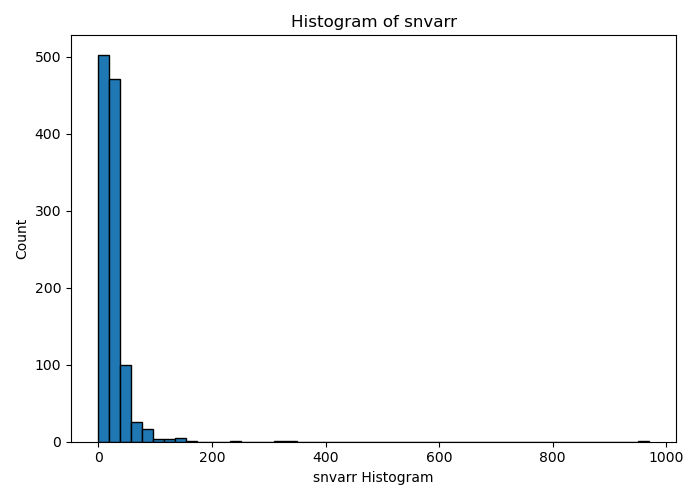

In [5]:

#Extract and flatten
data_sn    = snvarr.values.flatten()

# Histogram of snvar_ratio
fig, ax = p.subplots(1,1, figsize=(7, 5))
ax.hist(data_sn, bins=50, edgecolor="black")
ax.set_xlabel("snvarr Histogram")
ax.set_ylabel("Count")
#ax.set_xlim(-0.5, 200)
ax.set_title("Histogram of snvarr")

p.tight_layout()
p.show()

In [6]:
snvarr

max_per_channel = snvarr.max(dim="wavelength")

# Get the channel coordinate with the overall max met   ric
ch_with_max = max_per_channel.idxmax(dim="channel").item()
print("Channel with max snvarr:", ch_with_max)

Channel with max snvarr: S42D116


### Dropped channels with new SNVARR metric

Channels below threshold in at least one wavelength:
38  channels
['S13D85' 'S4D36' 'S14D142' 'S43D56' 'S23D103' 'S20D103' 'S23D101'
 'S20D101' 'S43D55' 'S45D50' 'S45D56' 'S21D79' 'S21D78' 'S24D98' 'S19D77'
 'S44D115' 'S44D53' 'S44D54' 'S17D100' 'S23D81' 'S48D123' 'S56D134'
 'S55D131' 'S55D105' 'S51D21' 'S51D24' 'S11D136' 'S17D112' 'S19D111'
 'S53D15' 'S53D32' 'S49D106' 'S48D32' 'S46D127' 'S47D25' 'S18D128'
 'S38D126' 'S39D121']


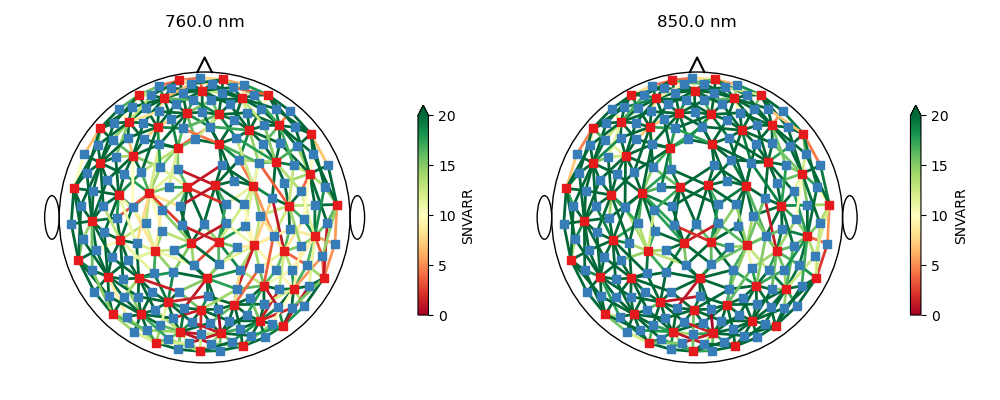

In [ ]:
# Threshold for SNVARR
thresh = 4
mask = (snvarr < thresh).any(dim="wavelength")
bad_channels_snvarr = snvarr.channel.where(mask, drop=True).values

print("Channels below SNVARR threshold in at least one wavelength:")
print(bad_channels_snvarr.size, " channels")
print(bad_channels_snvarr)

from matplotlib.colors import Normalize
norm = Normalize(vmin=0, vmax=20)

f, ax = p.subplots(1, 2, figsize=(10, 4))
for i, wl in enumerate(rec["od"].wavelength.values):
    plots.scalp_plot(
        rec["od"],
        rec.geo3d,
        snvarr.sel(wavelength=wl),
        ax[i],
        cmap="RdYlGn",
        norm=norm,                 # <- key bit
        title=f"{wl} nm",
        cb_label="SNVARR",
        channel_lw=2,
    )
f.tight_layout()


### Dropped channels with SNR and SCI/PSP Metric

channels that were masked according to the SNR threshold: ['S43D113' 'S43D55' 'S45D50' 'S45D56' 'S44D115' 'S44D53' 'S42D116'
 'S49D106' 'S47D115' 'S38D126']
Channels below SCI&PSP threshold:
70  channels
['S6D66' 'S6D1' 'S26D3' 'S5D139' 'S3D68' 'S2D140' 'S2D36' 'S1D38' 'S1D36'
 'S1D67' 'S32D69' 'S32D72' 'S32D67' 'S32D2' 'S31D9' 'S30D9' 'S3D66'
 'S3D67' 'S4D36' 'S5D140' 'S5D96' 'S2D38' 'S1D39' 'S6D3' 'S32D70' 'S40D46'
 'S39D46' 'S28D43' 'S30D16' 'S35D16' 'S43D56' 'S42D55' 'S45D115' 'S18D115'
 'S18D74' 'S16D103' 'S23D103' 'S20D103' 'S43D113' 'S43D55' 'S45D50'
 'S45D56' 'S21D79' 'S21D78' 'S24D98' 'S19D77' 'S44D115' 'S44D53' 'S44D54'
 'S42D116' 'S28D16' 'S23D81' 'S6D17' 'S49D122' 'S51D122' 'S55D122'
 'S48D123' 'S49D124' 'S55D131' 'S55D105' 'S51D21' 'S51D24' 'S17D112'
 'S49D106' 'S48D32' 'S46D127' 'S47D115' 'S47D25' 'S38D126' 'S39D121']


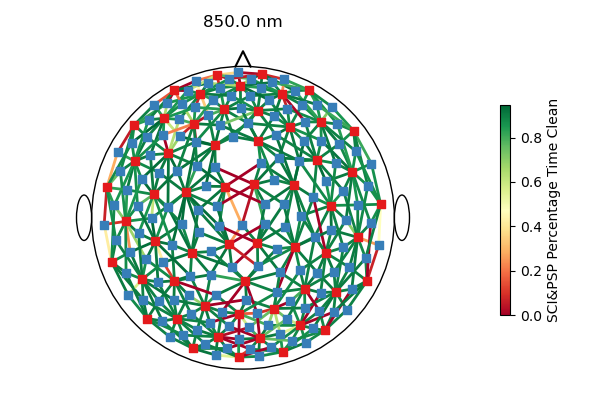

In [8]:
# SNR thresholding using the "snr" function of the quality subpackage
snr, snr_mask = quality.snr(rec["amp"], 5)

# alternatively, we can "drop" all channels with an SNR below the threshold. Since the SNR of both wavelength might differ
# (pass the threshold for one wavelength, but not for the other), we collapse to the "channel" dimension.
data_masked_snr_2, masked_elements_2 = xrutils.apply_mask(rec["amp"], snr_mask, "drop", "channel")

# show some results
print(f"channels that were masked according to the SNR threshold: {masked_elements_2}")


# SCI / PSP thresholding
sci_threshold = 0.75
psp_threshold = 0.1
window_length = 5*units.s
perc_clean_thresh = 0.5

sci, sci_mask = quality.sci(rec["amp"], window_length, sci_threshold)
psp, psp_mask = quality.psp(rec["amp"], window_length, psp_threshold)

sci_x_psp_mask = sci_mask & psp_mask
perc_time_clean = sci_x_psp_mask.sum(dim="time") / len(sci.time)

bad_channels_sci = perc_time_clean < perc_clean_thresh
bad_channels_sci = perc_time_clean.channel.where(bad_channels_sci, drop=True).values

print("Channels below SCI&PSP threshold:")
print(bad_channels_sci.size, " channels")
print(bad_channels_sci)

# print scalp plot

f, ax = p.subplots(1, 1, figsize=(6, 4))
plots.scalp_plot(
    rec["amp"],
    rec.geo3d,
    perc_time_clean,
    ax,
    cmap="RdYlGn",
    title=f"{wl} nm",
    cb_label="SCI&PSP Percentage Time Clean",
    channel_lw=2
)
f.tight_layout()

### Compare SCI&PSP and SNVARR Masks

Channels below SNVARR and SCI&PSP threshold:
27  channels
['S17D112' 'S19D77' 'S20D103' 'S21D78' 'S21D79' 'S23D103' 'S23D81'
 'S24D98' 'S38D126' 'S39D121' 'S43D55' 'S43D56' 'S44D115' 'S44D53'
 'S44D54' 'S45D50' 'S45D56' 'S46D127' 'S47D25' 'S48D123' 'S48D32'
 'S49D106' 'S4D36' 'S51D21' 'S51D24' 'S55D105' 'S55D131']
Channels that are dropped only by SNVARR:
11  channels
['S11D136' 'S13D85' 'S14D142' 'S17D100' 'S18D128' 'S19D111' 'S20D101'
 'S23D101' 'S53D15' 'S53D32' 'S56D134']
Channels that are dropped only by SCI&PSP:
43  channels
['S16D103' 'S18D115' 'S18D74' 'S1D36' 'S1D38' 'S1D39' 'S1D67' 'S26D3'
 'S28D16' 'S28D43' 'S2D140' 'S2D36' 'S2D38' 'S30D16' 'S30D9' 'S31D9'
 'S32D2' 'S32D67' 'S32D69' 'S32D70' 'S32D72' 'S35D16' 'S39D46' 'S3D66'
 'S3D67' 'S3D68' 'S40D46' 'S42D116' 'S42D55' 'S43D113' 'S45D115' 'S47D115'
 'S49D122' 'S49D124' 'S51D122' 'S55D122' 'S5D139' 'S5D140' 'S5D96' 'S6D1'
 'S6D17' 'S6D3' 'S6D66']


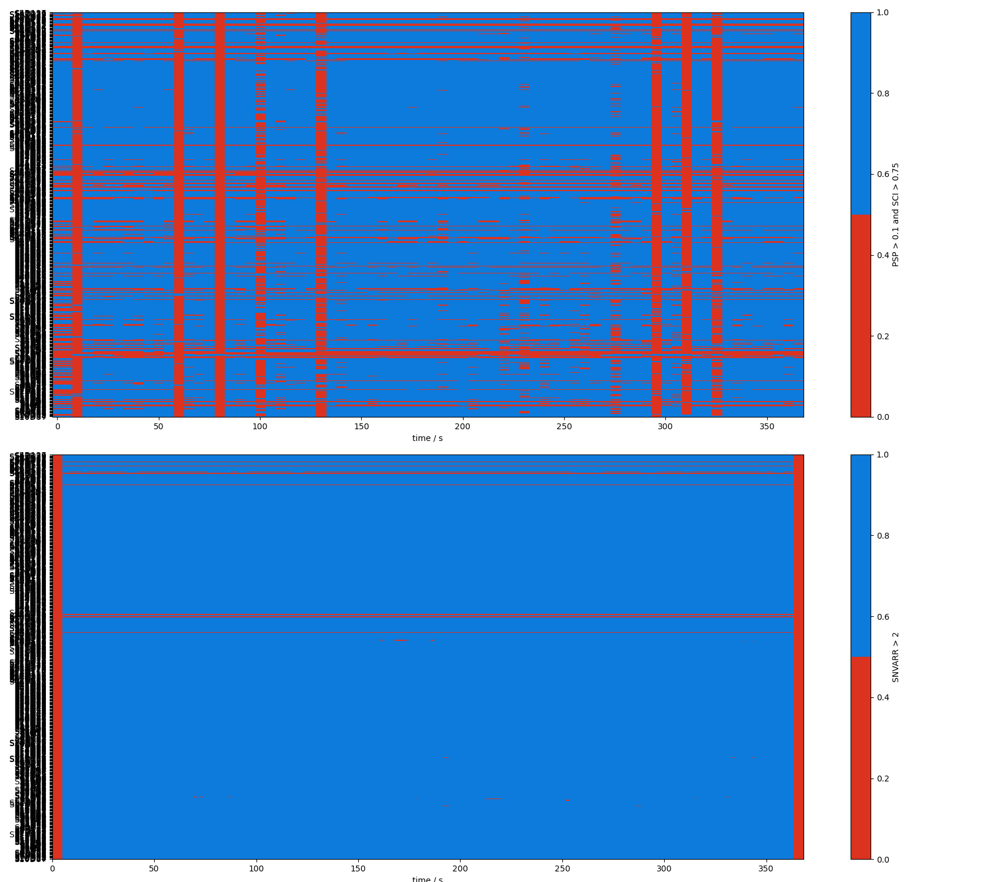

In [9]:
# we can also plot this as a binary heatmap
from matplotlib.colors import LinearSegmentedColormap
sci_binary_cmap = LinearSegmentedColormap.from_list("sci_binary_cmap", list(zip([0,0.5,0.5,1],["#DC3220","#DC3220","#0C7BDC","#0C7BDC"])))

f,ax = p.subplots(2,1,figsize=(17,15))

m0 = ax[0].pcolormesh(sci_x_psp_mask.time, np.arange(len(sci_x_psp_mask.channel)), sci_x_psp_mask, shading="nearest", cmap=sci_binary_cmap)
cb0 = p.colorbar(m0, ax=ax[0])
p.tight_layout()
ax[0].yaxis.set_ticks(np.arange(len(sci_x_psp_mask.channel)))
ax[0].yaxis.set_ticklabels(sci_x_psp_mask.channel.values);
cb0.set_label("PSP > 0.1 and SCI > 0.75")
ax[0].set_xlabel("time / s");


# collapse quality_mask along wavelength dimension 
quality_mask_c = quality_mask.mean(dim="wavelength")


m1 = ax[1].pcolormesh(quality_mask_c.time, np.arange(len(quality_mask_c.channel)), quality_mask_c, shading="nearest", cmap=sci_binary_cmap)
cb1 = p.colorbar(m1, ax=ax[1])
p.tight_layout()
ax[1].yaxis.set_ticks(np.arange(len(snvarr.channel)))
ax[1].yaxis.set_ticklabels(quality_mask_c.channel.values);
cb1.set_label("SNVARR > 2")
ax[1].set_xlabel("time / s");


# checks which channels are in both bad_channels_snvarr and bad_channels_sci
bad_channels_both = np.intersect1d(bad_channels_snvarr, bad_channels_sci)
print("Channels below SNVARR and SCI&PSP threshold:")
print(bad_channels_both.size, " channels")
print(bad_channels_both)

# channels that are dropped only in bad_channels_snvarr
bad_channels_only_snvarr = np.setdiff1d(bad_channels_snvarr, bad_channels_both)
print("Channels that are dropped only by SNVARR:")
print(bad_channels_only_snvarr.size, " channels")
print(bad_channels_only_snvarr)

# channels that are dropped only in bad_channels_sci
bad_channels_only_sci = np.setdiff1d(bad_channels_sci, bad_channels_both)
print("Channels that are dropped only by SCI&PSP:")
print(bad_channels_only_sci.size, " channels")
print(bad_channels_only_sci)

### Plot Raw and cleaned signal, and estimated noises

c:\Users\avonl\anaconda3\envs\cedalion\Lib\site-packages\xarray\core\variable.py:338: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  data = np.asarray(data)


[  5.41172887 137.2752862   57.56719149   4.07024022   6.37820184
  22.22225958   4.06005852   6.95913706  55.71348854  38.97367961
   5.87586668   7.72428163  28.50126743  48.68269969  10.17083303
   6.71747153  16.71234802  15.89456139  12.78490353  42.26472635
  10.77005667  22.56763998  79.06342381  72.19311261  18.14292761
   8.07601565  65.28034419 969.0956565    8.27742321  83.63845231
 148.64676928  53.10403195 313.50854145  89.75875282 120.61617443
 101.14489933  12.09821539   8.57261299  12.82962465   7.29940036
  12.12087675  38.22742479   7.56506889]


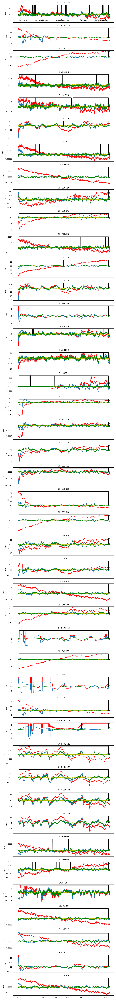

In [12]:
## Finger Tapping Data
#chlist = ["S5D13", "S8D16", "S1D9", "S8D7"]
## NN Resting Data
# chlist = ["S10D89", "S43D55", "S47D115", "S44D115"]
## DOT data
# chlist = ["S13D26", "S3D1", "S2D9", "S14D27"] # check large cardiac innovation effect 
#chlist = bad_channels_both
#chlist = bad_channels_only_snvarr
chlist = bad_channels_only_sci

wl = "760"

time = rec["od_filt"].time


f, ax = p.subplots(chlist.size, 1, sharex=True, figsize=(10, 2*chlist.size))
for i, CH in enumerate(chlist):
    ax[i].plot( time, rec["od"].sel(channel=CH, wavelength=wl), "r-", label="raw signal")
    ax[i].plot( time, rec["od_filt"].sel(channel=CH, wavelength=wl), "-", label="raw hpfilt signal")
    ax[i].plot( time, noise_est.sel(channel=CH, wavelength=wl), "y-", label="estimated noise")
    ax[i].plot( time, quality_mask.sel(channel=CH, wavelength=wl)*rec["od"].sel(channel=CH, wavelength=wl).max(), "k-", label="quality mask")
    ax[i].plot( time, sig_est.sel(channel=CH, wavelength=wl), "g-", label="signal estimate")
    ax[i].set_title(f"Ch. {CH}")
    # add stim markers using Cedalion's plot_stim_markers function
    cedalion.plots.plot_stim_markers(ax[i], rec.stim, y=1)
    ax[i].set_ylabel(r"OD")

ax[0].legend(ncol=6)
ax[i].set_label("time / s")
#ax[3].set_xlim(0,500)
p.tight_layout()

# print ratio between signal variance and noise variance for selected channel and wavelength
print(snvarr.sel(channel=chlist, wavelength=wl).values)

### Plot Noise Covariance

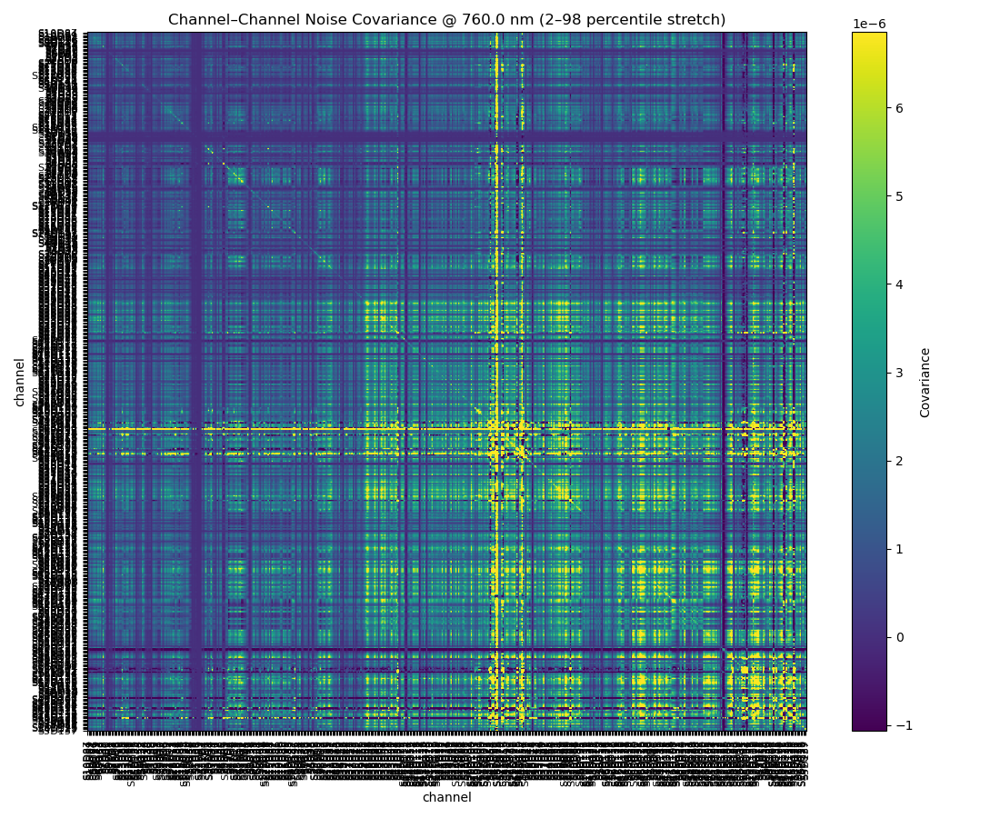

In [11]:
cov_760 = ncov.sel(wavelength="760")

# Get labels from coords
labels = cov_760.coords["channel_i"].values

# Percentile-based vmin/vmax (robust to outliers)
p_low, p_high = 2, 98
vmin, vmax = np.percentile(cov_760.values, [p_low, p_high])

fig, ax = p.subplots(figsize=(11, 9))

im = ax.imshow(
    cov_760.values,   # 2D (channel_i x channel_j)
    aspect="auto",
    cmap="viridis",
    vmin=vmin,
    vmax=vmax,
)

# ticks & labels
n = len(labels)
ax.set_xticks(np.arange(n))
ax.set_xticklabels(labels, rotation=90, fontsize=8)
ax.set_yticks(np.arange(n))
ax.set_yticklabels(labels, fontsize=8)

# colorbar
cbar = fig.colorbar(im, ax=ax)
cbar.set_label("Covariance")

# axes labels and title (show the actual selected wavelength)
ax.set_xlabel("channel")
ax.set_ylabel("channel")
ax.set_title(
    f"Channel–Channel Noise Covariance @ {cov_760.coords['wavelength'].item()} nm "
    f"({p_low}–{p_high} percentile stretch)"
)

p.tight_layout()
p.show()